In [1]:
from utils.utils import *
from utils.indices import *
from utils.band_info import planet_name_band
from change_detection_algorithms.PCAkmeans import *
from sklearn.metrics.pairwise import cosine_similarity
import warnings
from kneed import KneeLocator
warnings.filterwarnings('ignore')
np.set_printoptions(suppress=True)

### GET TILES

In [2]:

# Usage example
satellite_image_path = '/home/sambal/Desktop/Plaksha-CDA/stubble_burning/data/change_detection/20221016_044056_58_2429_3B_AnalyticMS_SR_8b_clip.tif'
output_folder = 'data/change_detection/20221016'
shp_file='data/merged_shp/converted_shapefile.shp'
#extract_tiles_from_image(satellite_image_path, output_folder,shp_file)

# Change detection

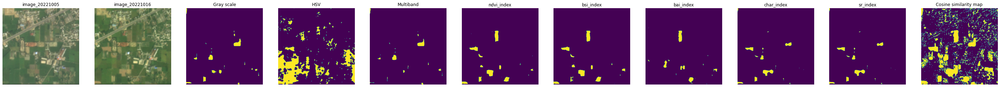

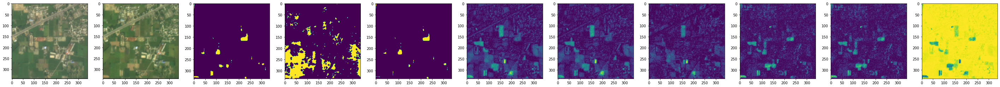

***************************************************************************************************


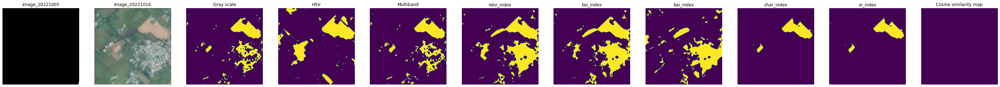

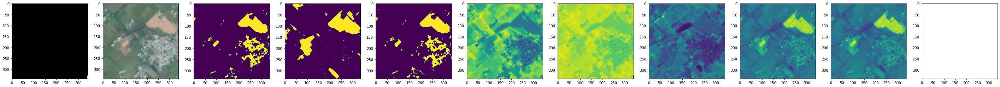

***************************************************************************************************


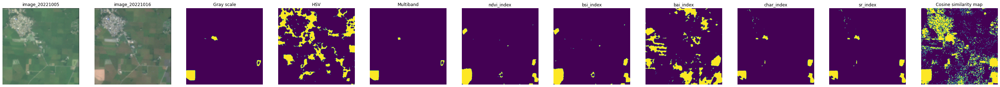

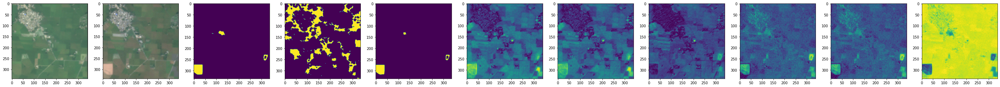

***************************************************************************************************


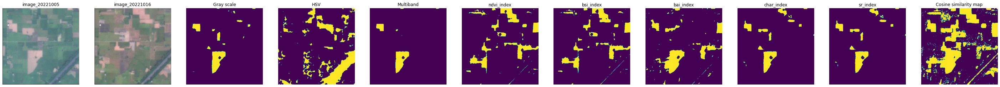

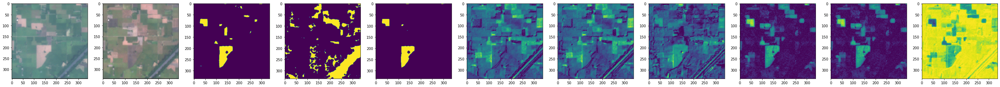

***************************************************************************************************


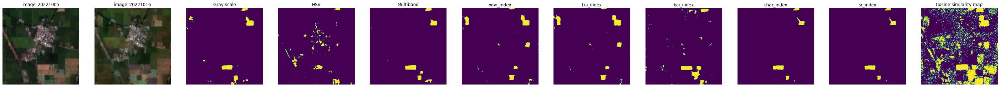

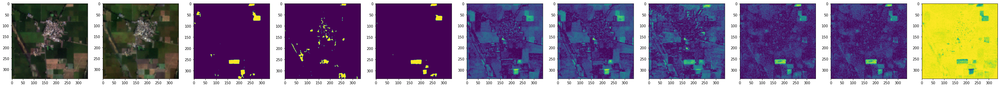

***************************************************************************************************


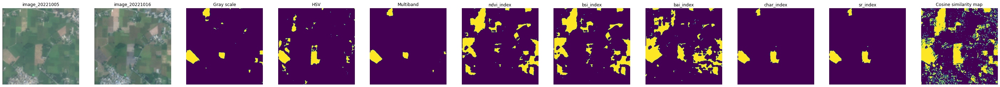

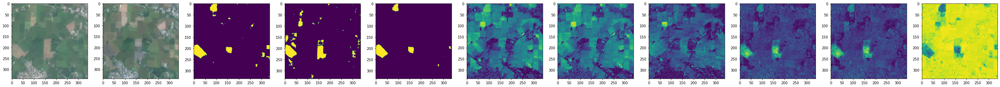

***************************************************************************************************


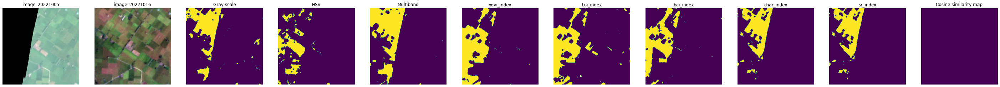

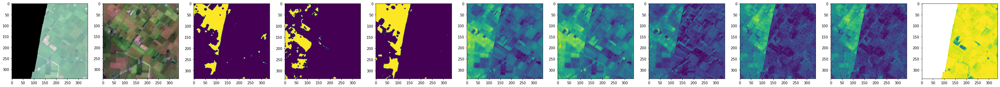

***************************************************************************************************


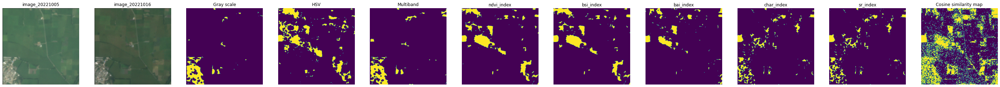

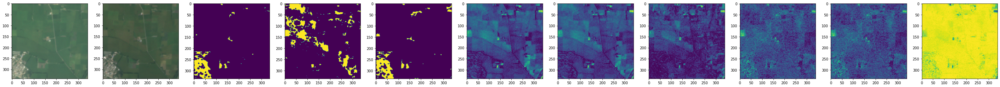

***************************************************************************************************


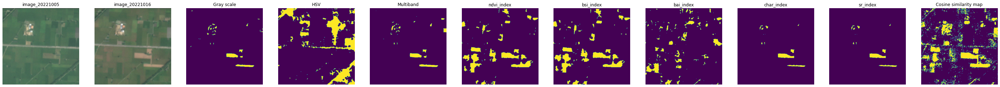

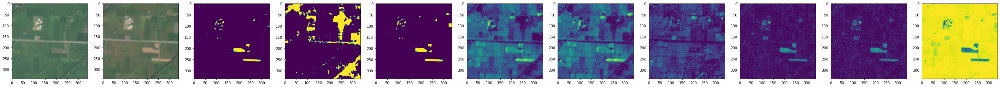

***************************************************************************************************


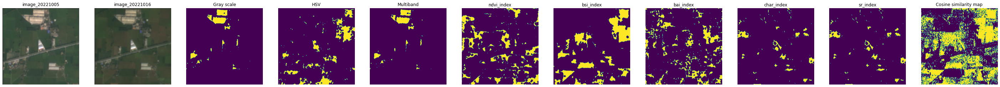

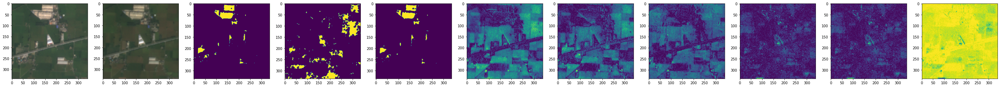

***************************************************************************************************


In [4]:
import os
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd


input_folder_1 = '/home/sambal/Desktop/agri-sensing-india/agsi/assets/stubble_burn/data/change_detection/20221005'  # Specify the output folder path
input_folder_2 = '/home/sambal/Desktop/agri-sensing-india/agsi/assets/stubble_burn/data/change_detection/20221016' 

x=os.listdir(input_folder_1)
y=os.listdir(input_folder_2)

intersecting_files=list(set(x).intersection(set(y)))
#intersecting_files=sorted(intersecting_files)


# Iterate over the files in the output folder
for filename in intersecting_files[:10]:

    file_path_1 = os.path.join(input_folder_1,filename)
    file_path_2 = os.path.join(input_folder_2,filename)

    image_1,image_bounds_1,all_indices_1=get_image(file_path_1,planet_name_band)
    image_2,image_bounds_2,all_indices_2=get_image(file_path_2,planet_name_band)
    
    fig,ax = plt.subplots(1, 11,figsize=(50,50))
    ax[0].imshow(image_1[:,:,[5,3,1]])
    ax[0].set_title("image_20221005")
    ax[1].imshow(image_2[:,:,[5,3,1]])
    ax[1].set_title("image_20221016")

    change_map_gray,diff_image_gray=find_PCAKmeans(image_1, image_2,type='gray')
    change_map_hsv,diff_image_hsv=find_PCAKmeans(image_1, image_2,type='hsv')
    change_map_multiband,diff_mage_multiband=find_PCAKmeans(image_1, image_2,type='multiband')

    #change map on indices

    change_map_indices=[]
    change_map_diff_image=[change_map_gray,change_map_hsv,change_map_multiband]

    for i in range(len(all_indices_1)):
        change_map,diff_image=find_PCAKmeans(all_indices_1[i],all_indices_2[i],type='index')
        change_map_indices.append(change_map)
        change_map_diff_image.append(diff_image)

    #image_1_channels=[image_1_gray,image_1_hsv]
    #image_2_channels=[image_2_gray,image_2_hsv]

    sim_map,dot_product=get_channel_sim(all_indices_1,all_indices_2)

    ax[2].imshow(change_map_gray)
    ax[2].set_title("Gray scale")
    ax[3].imshow(change_map_hsv)
    ax[3].set_title("HSV")
    ax[4].imshow(change_map_multiband)
    ax[4].set_title("Multiband")
    

    change_map_title=["ndvi_index","bsi_index","bai_index","char_index","sr_index"]

    for i in range(5,10):
        ax[i].imshow(change_map_indices[i-5])
        ax[i].set_title(change_map_title[i-5])

    ax[10].imshow(sim_map)
    ax[10].set_title("Cosine similarity map")     

    for axs in ax.ravel():
        axs.set_axis_off()    

    plt.show()

    fig,ax = plt.subplots(1, 11,figsize=(50,50))
    ax[0].imshow(image_1[:,:,[5,3,1]])
    ax[1].imshow(image_2[:,:,[5,3,1]])

    for i in range(2,10):
        ax[i].imshow(change_map_diff_image[i-2])

    ax[10].imshow(dot_product)
        
    plt.show()

    print("***************************************************************************************************")


    

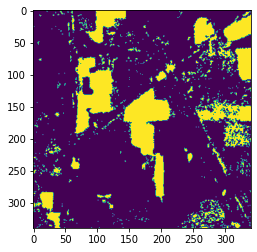

In [27]:
plt.imshow(sim_map)
plt.show()

(array([    5.,    14.,    17.,    29.,    60.,    95.,   338.,  1902.,
        18542., 94598.]),
 array([0.92707749, 0.93436956, 0.94166164, 0.94895371, 0.95624578,
        0.96353785, 0.97082993, 0.978122  , 0.98541407, 0.99270614,
        0.99999821]),
 <BarContainer object of 10 artists>)

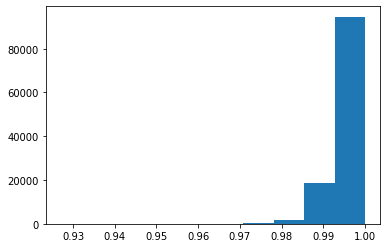

In [8]:
plt.hist(dot_product.flatten())

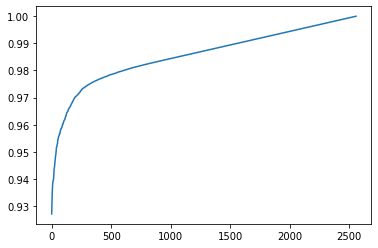

In [12]:
index_array=dot_product.flatten()
get_left_skews=index_array.round(5)
get_left_skews=np.unique(get_left_skews)
get_left_skews=sorted(get_left_skews)

plt.plot(get_left_skews)

<function matplotlib.pyplot.show(close=None, block=None)>

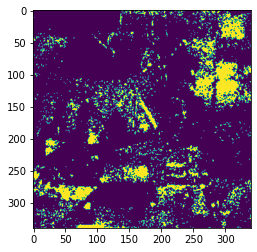

In [29]:
sim_map=np.where(dot_product<0.992,1,0)
plt.imshow(sim_map)
plt.show

In [24]:
dot_product.flatten().std()

0.003996593948220606